<a href="https://colab.research.google.com/github/MRI-2021/Computer-science-fundamentals/blob/main/Widening%20Participation%20undergraduate%20UCAS%202010%202021.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [2]:
from google.colab import files
uploaded = files.upload()

Saving Unifrog data_file.csv to Unifrog data_file.csv


In [3]:
import io
df = pd.read_csv(io.BytesIO(uploaded['Unifrog data_file.csv']))
# Activity dataset is now stored in a Pandas Dataframe

In [4]:
print('\n============= HEAD =============')
print(df.head(3))
print('\n============= DESCRIBE =============')
print(df.describe())


============= HEAD =============
                     inst_all INSTITUTION_CODE  Cycle  \
0  A20 University of Aberdeen              A20   2010   
1  A20 University of Aberdeen              A20   2010   
2  A20 University of Aberdeen              A20   2010   

                  statistic  equality_dimension      agegroup   value  
0  June deadline applicants               Total  18 year olds  7325.0  
1  June deadline applicants  White ethnic group  18 year olds  6800.0  
2  June deadline applicants  Black ethnic group  18 year olds    70.0  

============= DESCRIBE =============
               Cycle          value
count  386856.000000  379723.000000
mean     2015.500000    1311.430507
std         3.452057    3253.198768
min      2010.000000     -22.700000
25%      2012.750000       0.902000
50%      2015.500000     110.800000
75%      2018.250000    1030.000000
max      2021.000000   56355.000000


In [5]:
print('\n============= INFO =============')
df.info()


============= INFO =============
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 386856 entries, 0 to 386855
Data columns (total 7 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   inst_all            386856 non-null  object 
 1   INSTITUTION_CODE    386856 non-null  object 
 2   Cycle               386856 non-null  int64  
 3   statistic           386856 non-null  object 
 4   equality_dimension  386856 non-null  object 
 5   agegroup            386856 non-null  object 
 6   value               379723 non-null  float64
dtypes: float64(1), int64(1), object(5)
memory usage: 20.7+ MB


In [6]:
import plotly.express as px

fig = px.pie(df, values='value', names='equality_dimension')
fig.update_traces(textposition='inside')
fig.update_layout(uniformtext_minsize=22, uniformtext_mode='hide', title_text='UK\n' + 'Value VS equality dimension', title_x=0.45)

fig.show()

In [7]:
# Let's create a counter to compare my values.
# df['signup_count'] = '1'

# Let's check that it has been created.
# print(df.nunique())

# Let's converte age group in boolean (18 year olds and All ages, become True and False).
# df['BoolAgeGroup'] = df['agegroup'] == '18 year olds'

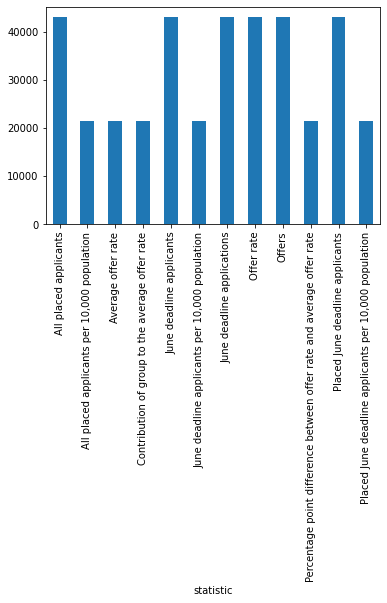

In [8]:
# Plot the Size of each Group in a Groupby object (of a single column).
df.groupby(['statistic']).size().plot(kind = "bar")

<Figure size 720x360 with 0 Axes>

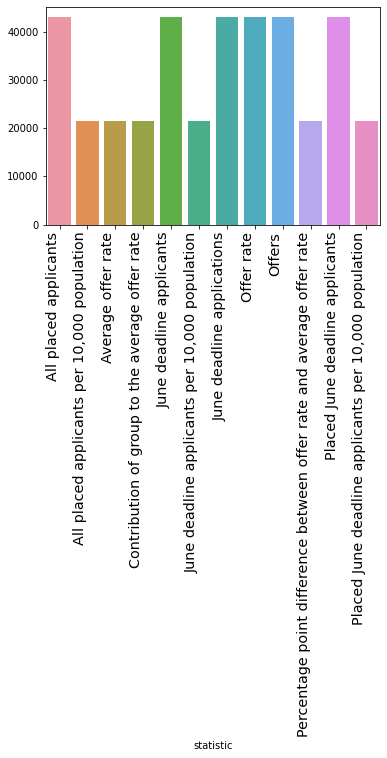

<Figure size 720x360 with 0 Axes>

In [9]:
result = df.groupby(['statistic']).size()

chart = sns.barplot(x = result.index, y = result.values)

plt.xticks(
    rotation=90, 
    horizontalalignment='right',
    fontweight='light',
    fontsize='x-large'  
)

plt.figure(figsize=(10,5))

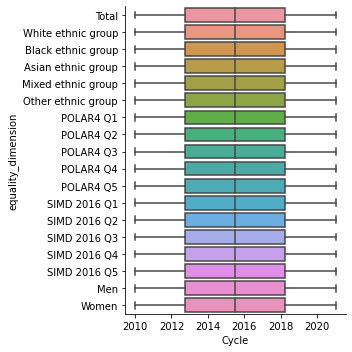

In [10]:
## Seaborn
sns.catplot(x = 'Cycle', y = 'equality_dimension', kind = 'box', data = df)
# plt.xticks(rotation = 90)
# plt.show()

##Plotly Express
# px.box(df, x = "Cycle", y = 'equality_dimension', hover_name = 'agegroup')

[Text(0.5, 1.0, 'UK\nPOLAR4 Q1')]

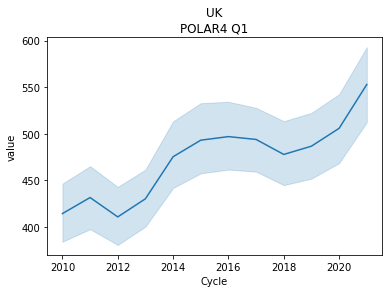

In [11]:
# This graph takes into account ALL universities and ALL ages (not only 18).
POLAR4_Q1 = df.query("equality_dimension == 'POLAR4 Q1'")
sns.lineplot(data=POLAR4_Q1, x="Cycle", y="value").set(title='UK\n' + 'POLAR4 Q1')

In [12]:
# df_wide = df.pivot("Cycle", "equality_dimension", "value")
# df_wide.head()

df_wide = df.pivot_table(index='Cycle', 
                        columns='equality_dimension', 
                        values='value')
df_wide.columns.name = None

df_wide

,Asian ethnic group,Black ethnic group,Men,Mixed ethnic group,Other ethnic group,POLAR4 Q1,POLAR4 Q2,POLAR4 Q3,POLAR4 Q4,POLAR4 Q5,SIMD 2016 Q1,SIMD 2016 Q2,SIMD 2016 Q3,SIMD 2016 Q4,SIMD 2016 Q5,Total,White ethnic group,Women
Cycle,,,,,,,,,,,,,,,,,,
2010,426.454525,255.675497,1847.889280,147.343463,51.091461,414.413399,601.936415,773.285792,971.902592,1373.540148,273.831774,359.073416,485.899378,608.580070,810.327952,4917.639571,3251.268168,2271.892220
2011,445.816855,275.496640,1884.254073,160.347773,54.006011,431.612257,616.107833,782.939717,987.172372,1394.320577,274.699855,358.885788,467.920311,610.642252,834.226430,5013.808276,3273.169139,2311.619342
2012,435.280978,273.867977,1754.460165,152.356744,62.472965,410.844291,584.627208,744.963552,930.558868,1314.414368,288.570725,365.626411,496.939481,625.961433,855.547837,4748.790927,3060.748293,2215.382768
2013,460.747461,288.252023,1821.523859,163.796747,65.005831,430.300355,606.890625,774.178062,963.314727,1350.375441,298.476296,384.254959,500.560874,628.498315,850.921411,4912.827983,3146.167671,2285.425832
2014,488.569578,303.399853,1887.842742,176.719539,73.043579,475.401721,651.957827,808.298104,990.778477,1367.858792,336.735674,408.651263,514.676552,645.075774,861.984219,5119.685607,3250.691846,2387.420186
2015,520.425118,319.031036,1924.199300,193.309719,78.569103,493.175037,672.546851,838.251819,1021.532872,1409.019890,353.001278,430.683637,547.619930,679.310030,892.018900,5286.635872,3312.068264,2490.405372
2016,542.897915,327.379604,1932.653898,201.497926,82.364911,497.005059,679.283887,838.568620,1023.908226,1428.079430,365.133404,445.977007,538.619663,687.703559,902.580659,5324.582227,3300.710391,2513.824069
2017,557.662496,316.851621,1910.812668,208.016854,88.991783,493.954747,663.175694,828.447773,1008.454010,1412.130036,397.088026,451.758541,538.125452,681.212748,879.827107,5250.564023,3224.499593,2474.104749
2018,574.865648,317.100215,1843.329974,209.163128,91.043347,477.877698,643.682163,793.673190,984.986723,1378.036223,397.533637,450.293011,533.911281,672.715152,871.533478,5097.158766,3073.251615,2413.803655


In [13]:
df_wide_statistic = df.pivot_table(index='Cycle', 
                        columns='statistic', 
                        values='value')
df_wide_statistic.columns.name = None

df_wide_statistic

,All placed applicants,"All placed applicants per 10,000 population",Average offer rate,Contribution of group to the average offer rate,June deadline applicants,"June deadline applicants per 10,000 population",June deadline applications,Offer rate,Offers,Percentage point difference between offer rate and average offer rate,Placed June deadline applicants,"Placed June deadline applicants per 10,000 population"
Cycle,,,,,,,,,,,,
2010,672.568398,24.858850,0.700167,0.350971,3434.796203,128.511558,3827.973199,0.639059,2439.257398,-0.498255,590.410385,21.678448
2011,681.414015,25.352038,0.663362,0.346646,3554.772473,133.675600,3947.018425,0.603071,2413.644612,-0.671807,592.823841,21.991234
2012,655.950586,25.278057,0.697934,0.346966,3352.800112,131.733836,3691.940257,0.637601,2367.405081,-0.651693,556.883026,21.675712
2013,687.710776,26.284366,0.727764,0.347609,3427.786153,135.257286,3749.232272,0.669295,2536.194863,-0.507254,588.403127,22.758236
2014,710.580681,27.180737,0.739208,0.346962,3562.162200,141.560916,3902.749860,0.681712,2682.705193,-0.527041,606.704355,23.552764
2015,740.425740,28.272362,0.744584,0.343979,3671.487996,145.968174,4005.797041,0.689041,2791.994696,-0.502478,627.966220,24.251535
2016,749.973479,29.301228,0.752165,0.344290,3694.459799,150.456840,4022.752652,0.696935,2820.725851,-0.442513,633.513400,24.999442
2017,752.911781,30.300782,0.770468,0.346666,3606.500558,153.129202,3926.843942,0.720708,2841.268844,-0.308566,630.763540,25.701228
2018,741.479620,30.794863,0.784475,0.349191,3472.599107,153.588889,3790.615578,0.738086,2793.580402,-0.325996,617.467895,26.166052


[Text(0.5, 1.0, 'UK\nPOLAR4 Q1')]

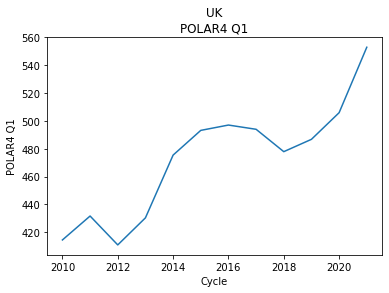

In [14]:
sns.lineplot(data=df_wide["POLAR4 Q1"]).set(title='UK\n' + 'POLAR4 Q1')

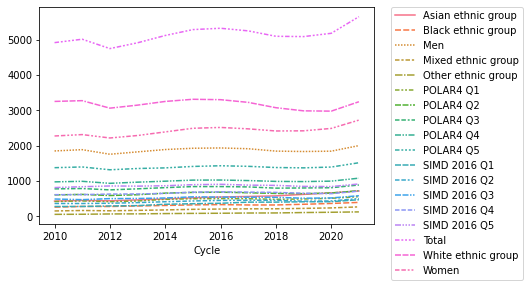

In [129]:
sns.lineplot(data=df_wide)

# Put the legend out of the figure
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

[Text(0.5, 1.0, 'UK\nmean and 95% confidence interval')]

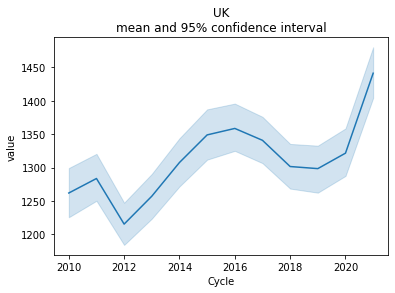

In [16]:
# mean and 95% confidence interval
sns.lineplot(data=df, x="Cycle", y="value").set(title='UK\n' + 'mean and 95% confidence interval')

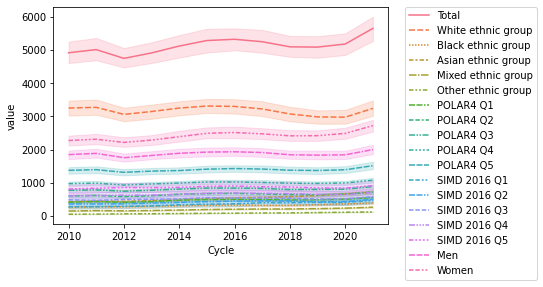

In [131]:
sns.lineplot(data=df, x="Cycle", y="value", hue="equality_dimension", style="equality_dimension")

# Put the legend out of the figure
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

<Figure size 432x288 with 0 Axes>

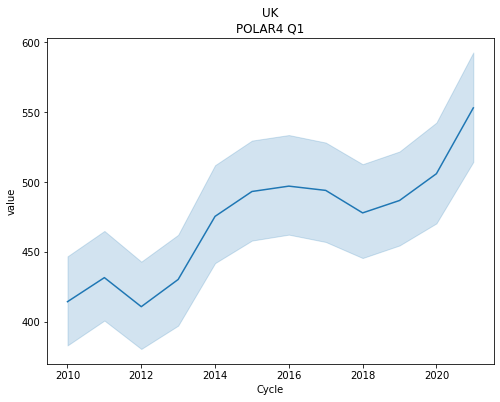

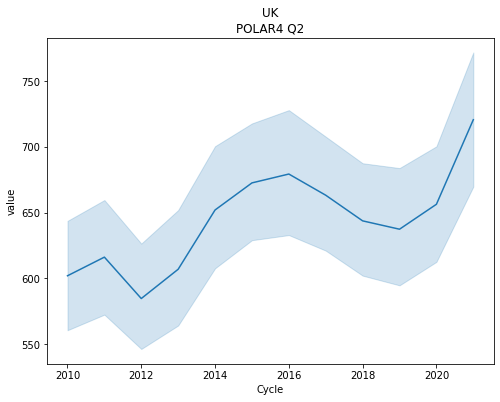

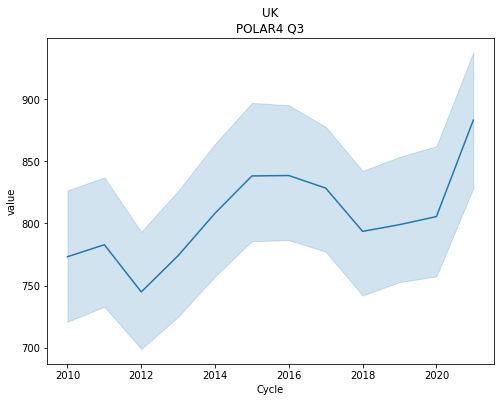

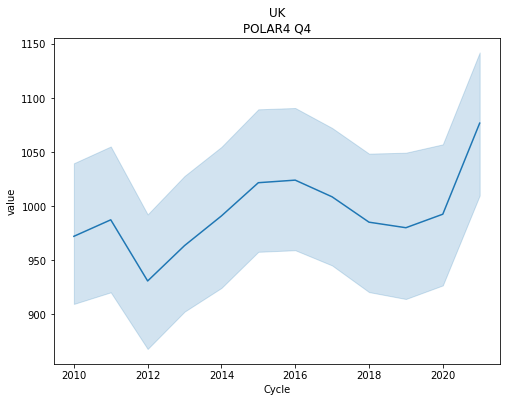

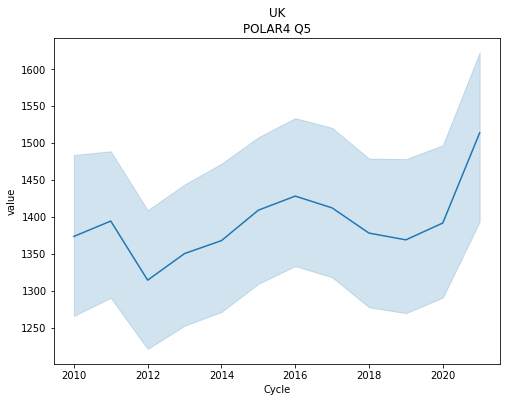

In [160]:
# This graph takes into account ALL universities and ALL ages (not only 18).
plt.figure(0)
plt.figure(figsize=(8, 6))
POLAR4_Q1 = df.query("equality_dimension == 'POLAR4 Q1'")
sns.lineplot(data=POLAR4_Q1, x="Cycle", y="value").set(title='UK\n' + 'POLAR4 Q1')

plt.figure(1)
plt.figure(figsize=(8, 6))
POLAR4_Q2 = df.query("equality_dimension == 'POLAR4 Q2'")
sns.lineplot(data=POLAR4_Q2, x="Cycle", y="value").set(title='UK\n' + 'POLAR4 Q2')

plt.figure(2)
plt.figure(figsize=(8, 6))
POLAR4_Q3 = df.query("equality_dimension == 'POLAR4 Q3'")
sns.lineplot(data=POLAR4_Q3, x="Cycle", y="value").set(title='UK\n' + 'POLAR4 Q3')

plt.figure(3)
plt.figure(figsize=(8, 6))
POLAR4_Q4 = df.query("equality_dimension == 'POLAR4 Q4'")
sns.lineplot(data=POLAR4_Q4, x="Cycle", y="value").set(title='UK\n' + 'POLAR4 Q4')

plt.figure(4)
plt.figure(figsize=(8, 6))
POLAR4_Q5 = df.query("equality_dimension == 'POLAR4 Q5'")
sns.lineplot(data=POLAR4_Q5, x="Cycle", y="value").set(title='UK\n' + 'POLAR4 Q5')

plt.show()

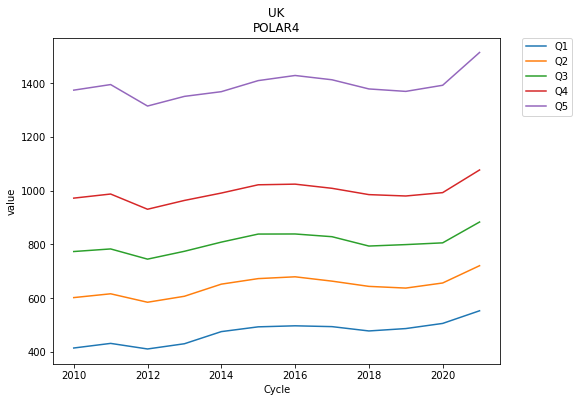

In [187]:
# TEST MULTIPLE CURVES ON ONE GRAPH
plt.figure(figsize=(8, 6))
POLAR4_Q1 = df.query("equality_dimension == 'POLAR4 Q1'")
sns.lineplot(data=POLAR4_Q1, x="Cycle", y="value", ci = None, label="Q1")

POLAR4_Q2 = df.query("equality_dimension == 'POLAR4 Q2'")
sns.lineplot(data=POLAR4_Q2, x="Cycle", y="value", ci = None, label="Q2")
POLAR4_Q3 = df.query("equality_dimension == 'POLAR4 Q3'")
sns.lineplot(data=POLAR4_Q3, x="Cycle", y="value", ci = None, label="Q3")

POLAR4_Q4 = df.query("equality_dimension == 'POLAR4 Q4'")
sns.lineplot(data=POLAR4_Q4, x="Cycle", y="value", ci = None, label="Q4")

POLAR4_Q5 = df.query("equality_dimension == 'POLAR4 Q5'")
sns.lineplot(data=POLAR4_Q5, x="Cycle", y="value", ci = None, label="Q5").set(title='UK\n' + 'POLAR4')

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

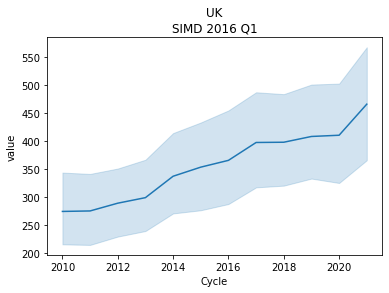

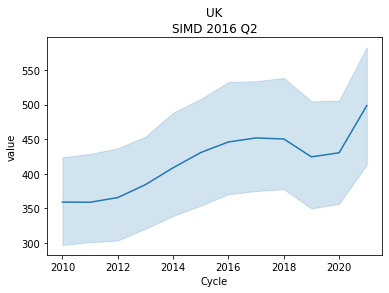

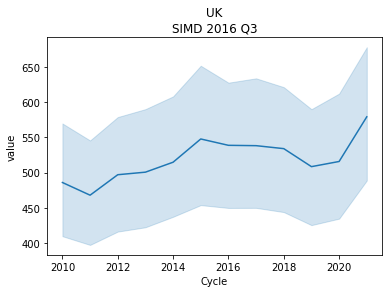

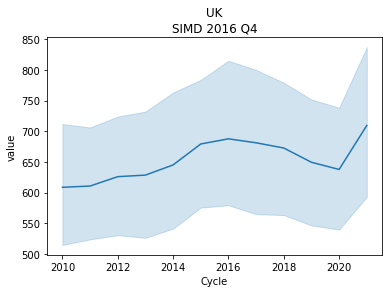

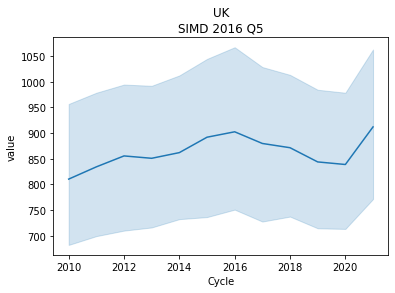

In [133]:
# This graph takes into account ALL universities and ALL ages (not only 18).
plt.figure(0)
SIMD2016_Q1 = df.query("equality_dimension == 'SIMD 2016 Q1'")
sns.lineplot(data=SIMD2016_Q1, x="Cycle", y="value").set(title='UK\n' + 'SIMD 2016 Q1')

plt.figure(1)
SIMD2016_Q2 = df.query("equality_dimension == 'SIMD 2016 Q2'")
sns.lineplot(data=SIMD2016_Q2, x="Cycle", y="value").set(title='UK\n' + 'SIMD 2016 Q2')

plt.figure(2)
SIMD2016_Q3 = df.query("equality_dimension == 'SIMD 2016 Q3'")
sns.lineplot(data=SIMD2016_Q3, x="Cycle", y="value").set(title='UK\n' + 'SIMD 2016 Q3')

plt.figure(3)
SIMD2016_Q4 = df.query("equality_dimension == 'SIMD 2016 Q4'")
sns.lineplot(data=SIMD2016_Q4, x="Cycle", y="value").set(title='UK\n' + 'SIMD 2016 Q4')

plt.figure(4)
SIMD2016_Q5 = df.query("equality_dimension == 'SIMD 2016 Q5'")
sns.lineplot(data=SIMD2016_Q5, x="Cycle", y="value").set(title='UK\n' + 'SIMD 2016 Q5')

plt.show()

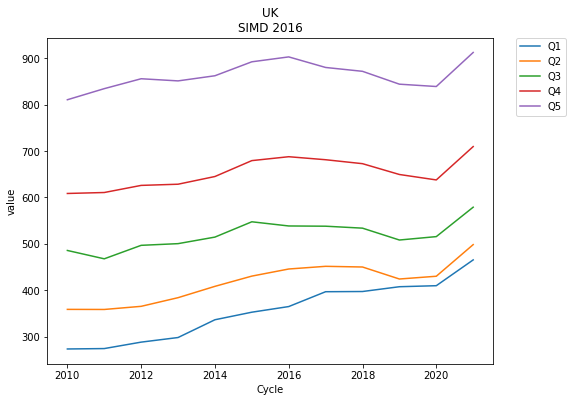

In [186]:
# This graph takes into account ALL universities and ALL ages (not only 18).
plt.figure(figsize=(8, 6))
SIMD2016_Q1 = df.query("equality_dimension == 'SIMD 2016 Q1'")
sns.lineplot(data=SIMD2016_Q1, x="Cycle", y="value", ci = None, label="Q1")

SIMD2016_Q2 = df.query("equality_dimension == 'SIMD 2016 Q2'")
sns.lineplot(data=SIMD2016_Q2, x="Cycle", y="value", ci = None, label="Q2")

SIMD2016_Q3 = df.query("equality_dimension == 'SIMD 2016 Q3'")
sns.lineplot(data=SIMD2016_Q3, x="Cycle", y="value", ci = None, label="Q3")

SIMD2016_Q4 = df.query("equality_dimension == 'SIMD 2016 Q4'")
sns.lineplot(data=SIMD2016_Q4, x="Cycle", y="value", ci = None, label="Q4")

SIMD2016_Q5 = df.query("equality_dimension == 'SIMD 2016 Q5'")
sns.lineplot(data=SIMD2016_Q5, x="Cycle", y="value", ci = None, label="Q5").set(title='UK\n' + 'SIMD 2016')

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

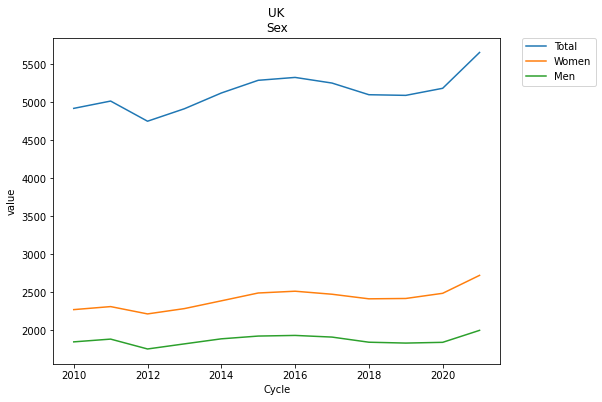

In [194]:
plt.figure(figsize=(8,6))
Total = df.query("equality_dimension == 'Total'")
sns.lineplot(data=Total, x="Cycle", y="value", ci = None, label="Total")

Women = df.query("equality_dimension == 'Women'")
sns.lineplot(data=Women, x="Cycle", y="value", ci = None, label="Women")

Men = df.query("equality_dimension == 'Men'")
sns.lineplot(data=Men, x="Cycle", y="value", ci = None, label="Men").set(title='UK\n' + 'Sex')

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

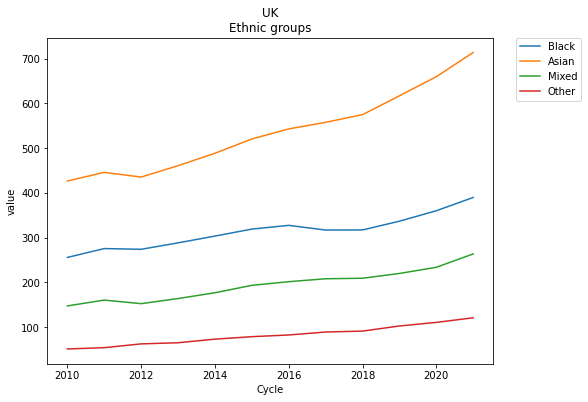

In [201]:
plt.figure(figsize=(8,6))
Black = df.query("equality_dimension == 'Black ethnic group'")
sns.lineplot(data=Black, x="Cycle", y="value", ci = None, label="Black")

Asian = df.query("equality_dimension == 'Asian ethnic group'")
sns.lineplot(data=Asian, x="Cycle", y="value", ci = None, label="Asian")

Mixed = df.query("equality_dimension == 'Mixed ethnic group'")
sns.lineplot(data=Mixed, x="Cycle", y="value", ci = None, label="Mixed")

Other = df.query("equality_dimension == 'Other ethnic group'")
sns.lineplot(data=Other, x="Cycle", y="value", ci = None, label="Other").set(title='UK\n' + 'Ethnic groups')

# White = df.query("equality_dimension == 'White ethnic group'")
# sns.lineplot(data=White, x="Cycle", y="value", ci = None, label="White")

# Total = df.query("equality_dimension == 'Total'")
# sns.lineplot(data=Total, x="Cycle", y="value", ci = None, label="Total").set(title='UK\n' + 'Ethnic groups')

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

<Figure size 432x288 with 0 Axes>

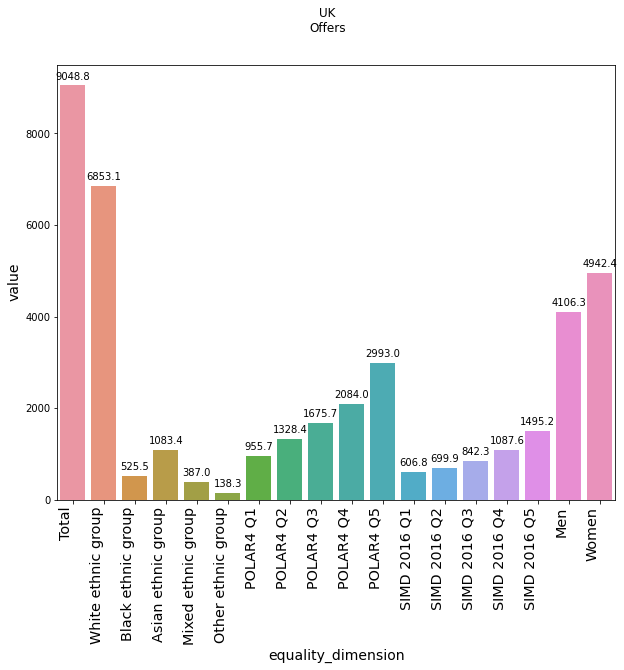

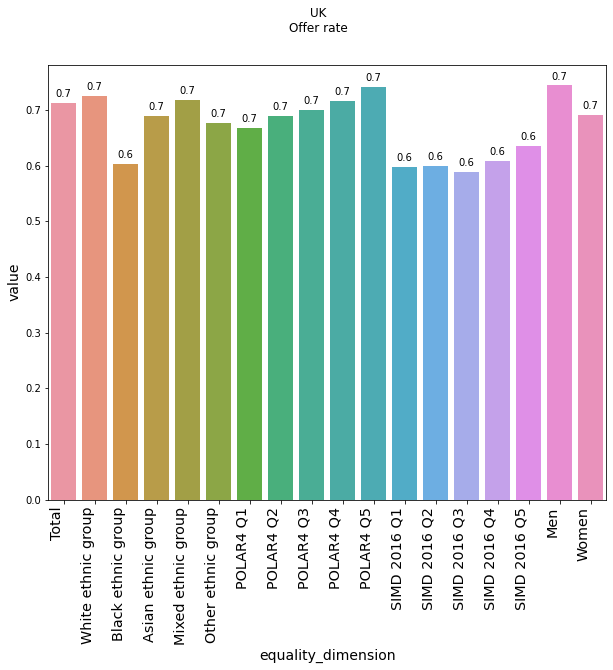

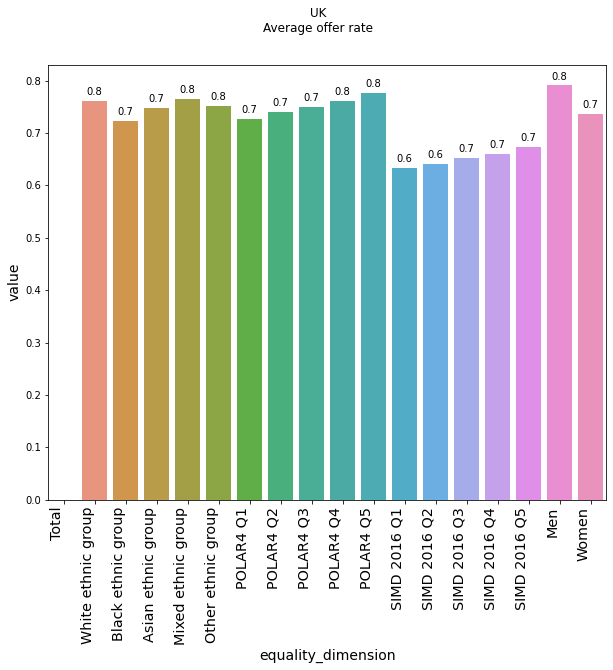

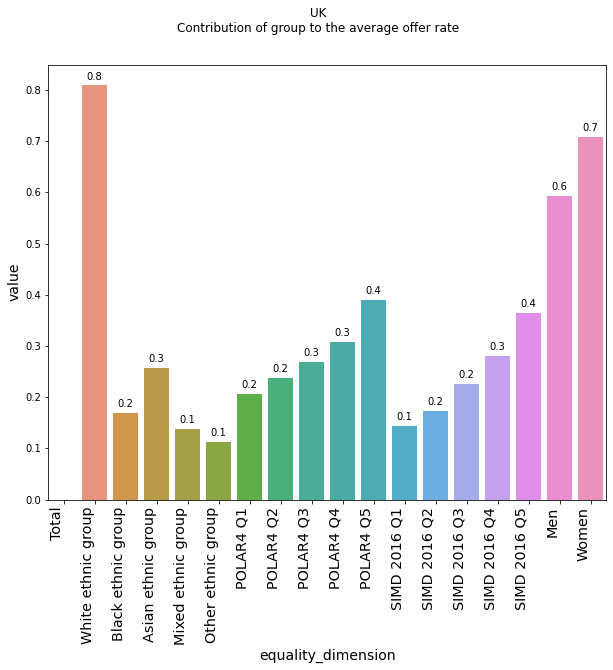

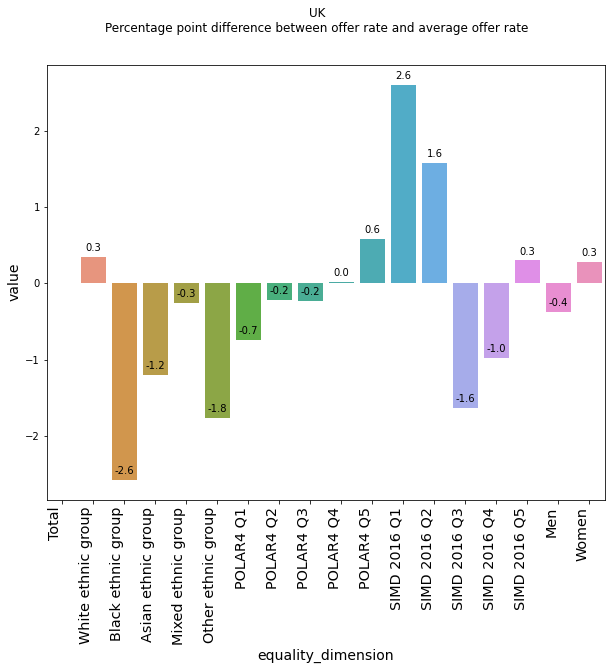

In [216]:
# Let's check if there is a trend in the values (check min and max value, does it match specifit universities, statistic or equality dimensions?)
# df.sort_values(by=['value'], ascending=True)
plt.figure(0)
Offers = df.query("statistic == 'Offers'")
plt.figure(figsize=(10, 8))

splot=sns.barplot(x="equality_dimension",y="value",data=Offers, ci = None)
plt.xticks(rotation=90, horizontalalignment='right', fontweight='light', fontsize='x-large')

for p in splot.patches:
    splot.annotate(format(p.get_height(), '.1f'), (p.get_x() + p.get_width() / 2., p.get_height()), ha = 'center', va = 'center', xytext = (0, 9), textcoords = 'offset points')
plt.xlabel("equality_dimension", size=14)
plt.ylabel("value", size=14)

splot.figure.suptitle('UK\n' + 'Offers')

plt.figure(1)
Offer_rate = df.query("statistic == 'Offer rate'")
plt.figure(figsize=(10, 8))

splot=sns.barplot(x="equality_dimension",y="value",data=Offer_rate, ci = None)
plt.xticks(rotation=90, horizontalalignment='right', fontweight='light', fontsize='x-large')

for p in splot.patches:
    splot.annotate(format(p.get_height(), '.1f'), (p.get_x() + p.get_width() / 2., p.get_height()), ha = 'center', va = 'center', xytext = (0, 9), textcoords = 'offset points')
plt.xlabel("equality_dimension", size=14)
plt.ylabel("value", size=14)

splot.figure.suptitle('UK\n' + 'Offer rate')

plt.figure(2)
Average_rate = df.query("statistic == 'Average offer rate'")
plt.figure(figsize=(10, 8))

splot=sns.barplot(x="equality_dimension",y="value",data=Average_rate, ci = None)
plt.xticks(rotation=90, horizontalalignment='right', fontweight='light', fontsize='x-large')

for p in splot.patches:
    splot.annotate(format(p.get_height(), '.1f'), (p.get_x() + p.get_width() / 2., p.get_height()), ha = 'center', va = 'center', xytext = (0, 9), textcoords = 'offset points')
plt.xlabel("equality_dimension", size=14)
plt.ylabel("value", size=14)

splot.figure.suptitle('UK\n' + 'Average offer rate')

plt.figure(3)
Contribution_rate = df.query("statistic == 'Contribution of group to the average offer rate'")
plt.figure(figsize=(10, 8))

splot=sns.barplot(x="equality_dimension",y="value",data=Contribution_rate, ci = None)
plt.xticks(rotation=90, horizontalalignment='right', fontweight='light', fontsize='x-large')

for p in splot.patches:
    splot.annotate(format(p.get_height(), '.1f'), (p.get_x() + p.get_width() / 2., p.get_height()), ha = 'center', va = 'center', xytext = (0, 9), textcoords = 'offset points')
plt.xlabel("equality_dimension", size=14)
plt.ylabel("value", size=14)

splot.figure.suptitle('UK\n' + 'Contribution of group to the average offer rate')





plt.figure(4)
Percentage_difference = df.query("statistic == 'Percentage point difference between offer rate and average offer rate'")
plt.figure(figsize=(10, 8))

splot=sns.barplot(x="equality_dimension",y="value",data=Percentage_difference, ci = None)
plt.xticks(rotation=90, horizontalalignment='right', fontweight='light', fontsize='x-large')

for p in splot.patches:
    splot.annotate(format(p.get_height(), '.1f'), (p.get_x() + p.get_width() / 2., p.get_height()), ha = 'center', va = 'center', xytext = (0, 9), textcoords = 'offset points')
plt.xlabel("equality_dimension", size=14)
plt.ylabel("value", size=14)

splot.figure.suptitle('UK\n' + 'Percentage point difference between offer rate and average offer rate')

plt.show()

<Figure size 720x360 with 0 Axes>

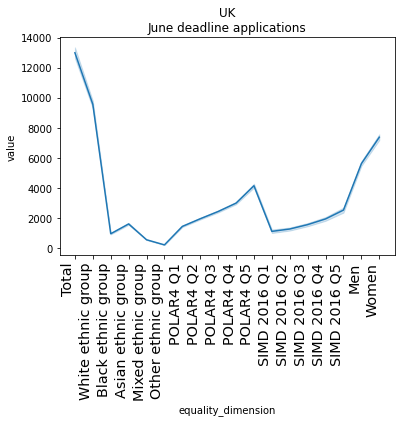

<Figure size 720x360 with 0 Axes>

In [35]:
applications = df.query("statistic == 'June deadline applications'")
chart = sns.lineplot(data=applications, x="equality_dimension", y="value").set(title='UK\n' + 'June deadline applications')

plt.xticks(
    rotation=90, 
    horizontalalignment='right',
    fontweight='light',
    fontsize='x-large'  
)

plt.figure(figsize=(10,5))

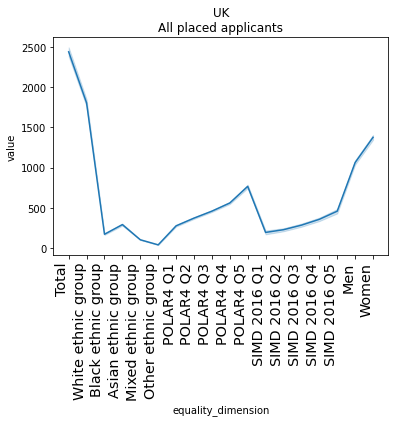

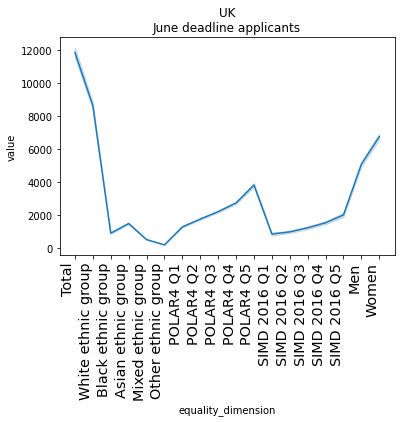

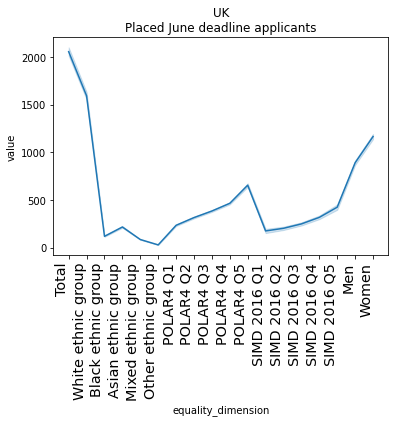

In [36]:
import matplotlib.pyplot as plt
import numpy as np

plt.figure(0)
All_placed = df.query("statistic == 'All placed applicants'")
chart = sns.lineplot(data=All_placed, x="equality_dimension", y="value").set(title='UK\n' + 'All placed applicants')
plt.xticks(rotation=90, horizontalalignment='right', fontweight='light', fontsize='x-large')

plt.figure(1)
June_deadline = df.query("statistic == 'June deadline applicants'")
chart = sns.lineplot(data=June_deadline, x="equality_dimension", y="value").set(title='UK\n' + 'June deadline applicants')
plt.xticks(rotation=90, horizontalalignment='right', fontweight='light', fontsize='x-large')

plt.figure(2)
Placed_June = df.query("statistic == 'Placed June deadline applicants'")
chart = sns.lineplot(data=Placed_June, x="equality_dimension", y="value").set(title='UK\n' + 'Placed June deadline applicants')
plt.xticks(rotation=90, horizontalalignment='right', fontweight='light', fontsize='x-large')

plt.show()

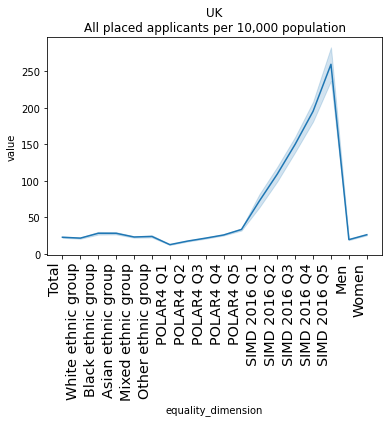

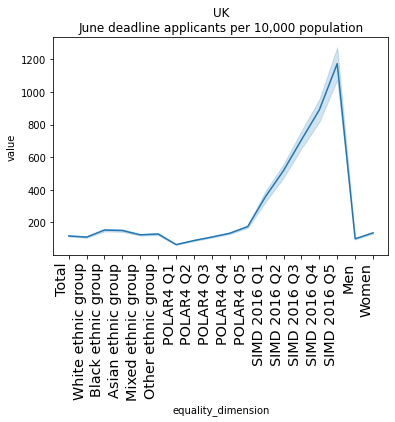

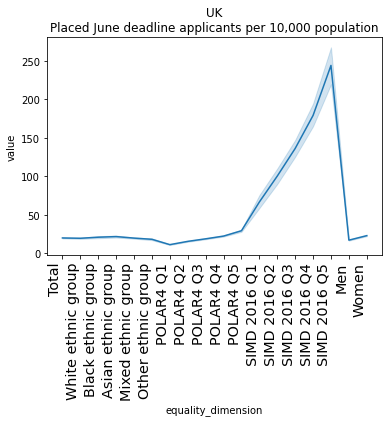

In [37]:
import matplotlib.pyplot as plt
import numpy as np

plt.figure(0)
All_placed10K = df.query("statistic == 'All placed applicants per 10,000 population'")
chart = sns.lineplot(data=All_placed10K, x="equality_dimension", y="value").set(title='UK\n' + 'All placed applicants per 10,000 population')
plt.xticks(rotation=90, horizontalalignment='right', fontweight='light', fontsize='x-large')

plt.figure(1)
June_deadline10K = df.query("statistic == 'June deadline applicants per 10,000 population'")
chart = sns.lineplot(data=June_deadline10K, x="equality_dimension", y="value").set(title='UK\n' + 'June deadline applicants per 10,000 population')
plt.xticks(rotation=90, horizontalalignment='right', fontweight='light', fontsize='x-large')

plt.figure(2)
Placed_June10K = df.query("statistic == 'Placed June deadline applicants per 10,000 population'")
chart = sns.lineplot(data=Placed_June10K, x="equality_dimension", y="value").set(title='UK\n' + 'Placed June deadline applicants per 10,000 population')
plt.xticks(rotation=90, horizontalalignment='right', fontweight='light', fontsize='x-large')

plt.show()

In [38]:
## Dataframe sorting when using .loc for University of Birmingham
df_UoB = df.loc[(df.inst_all == 'B32 University of Birmingham'),]
#.sort_values(by=['inst_all'], ascending=False)
df_UoB

,inst_all,INSTITUTION_CODE,Cycle,statistic,equality_dimension,agegroup,value
22032,B32 University of Birmingham,B32,2010,June deadline applicants,Total,18 year olds,22800.000
22033,B32 University of Birmingham,B32,2010,June deadline applicants,White ethnic group,18 year olds,17515.000
22034,B32 University of Birmingham,B32,2010,June deadline applicants,Black ethnic group,18 year olds,880.000
22035,B32 University of Birmingham,B32,2010,June deadline applicants,Asian ethnic group,18 year olds,3320.000
22036,B32 University of Birmingham,B32,2010,June deadline applicants,Mixed ethnic group,18 year olds,760.000
...,...,...,...,...,...,...,...
269851,B32 University of Birmingham,B32,2021,Offer rate,POLAR4 Q3,All ages,0.593
269852,B32 University of Birmingham,B32,2021,Offer rate,POLAR4 Q4,All ages,0.653
269853,B32 University of Birmingham,B32,2021,Offer rate,POLAR4 Q5,All ages,0.745
269854,B32 University of Birmingham,B32,2021,Offer rate,Men,All ages,0.675


In [39]:
# Data only of University of Birmingham
df_gb = df_UoB.groupby(['equality_dimension'])
df_agg = df_gb.agg({'equality_dimension': 'size'})
df_agg

,equality_dimension
equality_dimension,
Asian ethnic group,216
Black ethnic group,216
Men,216
Mixed ethnic group,216
Other ethnic group,216
POLAR4 Q1,216
POLAR4 Q2,216
POLAR4 Q3,216
POLAR4 Q4,216


In [40]:
df_UoB_Y13 = df_UoB.loc[(df_UoB.agegroup == '18 year olds'),]
#.sort_values(by=['equality_dimension'], ascending=False)
df_UoB_Y13

,inst_all,INSTITUTION_CODE,Cycle,statistic,equality_dimension,agegroup,value
22032,B32 University of Birmingham,B32,2010,June deadline applicants,Total,18 year olds,22800.000
22033,B32 University of Birmingham,B32,2010,June deadline applicants,White ethnic group,18 year olds,17515.000
22034,B32 University of Birmingham,B32,2010,June deadline applicants,Black ethnic group,18 year olds,880.000
22035,B32 University of Birmingham,B32,2010,June deadline applicants,Asian ethnic group,18 year olds,3320.000
22036,B32 University of Birmingham,B32,2010,June deadline applicants,Mixed ethnic group,18 year olds,760.000
...,...,...,...,...,...,...,...
23899,B32 University of Birmingham,B32,2021,Contribution of group to the average offer rate,POLAR4 Q3,18 year olds,0.238
23900,B32 University of Birmingham,B32,2021,Contribution of group to the average offer rate,POLAR4 Q4,18 year olds,0.234
23901,B32 University of Birmingham,B32,2021,Contribution of group to the average offer rate,POLAR4 Q5,18 year olds,0.421
23902,B32 University of Birmingham,B32,2021,Contribution of group to the average offer rate,Men,18 year olds,0.558


In [41]:
# Data only of University of Birmingham AND only 18 year olds
df_gb = df_UoB_Y13.groupby(['equality_dimension'])
df_agg = df_gb.agg({'equality_dimension': 'size'})
df_agg

,equality_dimension
equality_dimension,
Asian ethnic group,144
Black ethnic group,144
Men,144
Mixed ethnic group,144
Other ethnic group,144
POLAR4 Q1,144
POLAR4 Q2,144
POLAR4 Q3,144
POLAR4 Q4,144


In [42]:
# df_wide_UoB = df_UoB_Y13.pivot_table(index='Cycle', 
#                         columns='equality_dimension', 
#                         values='value')
# df_wide_UoB.columns.name = None

# df_wide_UoB

In [43]:
# df_wide_UoBstat = df_UoB_Y13.pivot_table(index='Cycle', 
#                         columns='statistic', 
#                         values='value')
# df_wide_UoBstat.columns.name = None

# df_wide_UoBstat

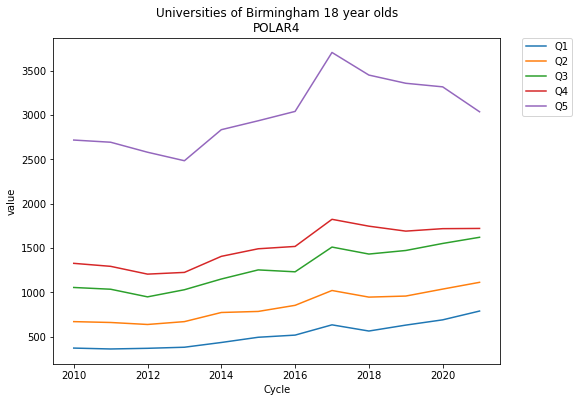

In [190]:
# This graph takes into account ONLY Universities of Birmingham and ONLY 18 year olds.
plt.figure(figsize=(8,6))
POLAR4_Q1 = df_UoB_Y13.query("equality_dimension == 'POLAR4 Q1'")
sns.lineplot(data=POLAR4_Q1, x="Cycle", y="value", ci=None, label='Q1')

POLAR4_Q2 = df_UoB_Y13.query("equality_dimension == 'POLAR4 Q2'")
sns.lineplot(data=POLAR4_Q2, x="Cycle", y="value", ci=None, label='Q2')

POLAR4_Q3 = df_UoB_Y13.query("equality_dimension == 'POLAR4 Q3'")
sns.lineplot(data=POLAR4_Q3, x="Cycle", y="value", ci=None, label='Q3')

POLAR4_Q4 = df_UoB_Y13.query("equality_dimension == 'POLAR4 Q4'")
sns.lineplot(data=POLAR4_Q4, x="Cycle", y="value", ci=None, label='Q4')

POLAR4_Q5 = df_UoB_Y13.query("equality_dimension == 'POLAR4 Q5'")
sns.lineplot(data=POLAR4_Q5, x="Cycle", y="value", ci=None, label='Q5').set(title='Universities of Birmingham 18 year olds\n' + 'POLAR4')

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

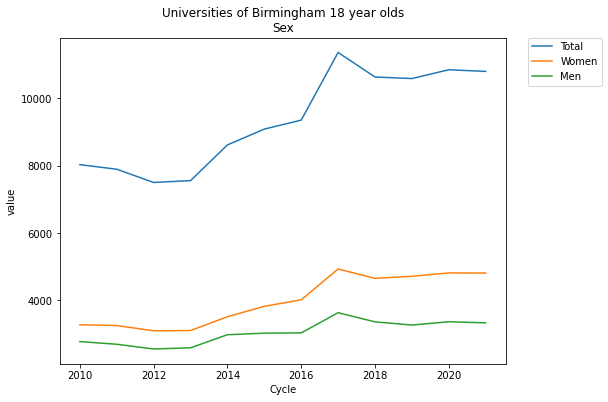

In [193]:
# This graph takes into account ONLY Universities of Birmingham and ONLY 18 year olds.
plt.figure(figsize=(8,6))
Total = df_UoB_Y13.query("equality_dimension == 'Total'")
sns.lineplot(data=Total, x="Cycle", y="value", ci=None, label='Total')

Women = df_UoB_Y13.query("equality_dimension == 'Women'")
sns.lineplot(data=Women, x="Cycle", y="value", ci=None, label='Women')

Men = df_UoB_Y13.query("equality_dimension == 'Men'")
sns.lineplot(data=Men, x="Cycle", y="value", ci=None, label='Men').set(title='Universities of Birmingham 18 year olds\n' + 'Sex')

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

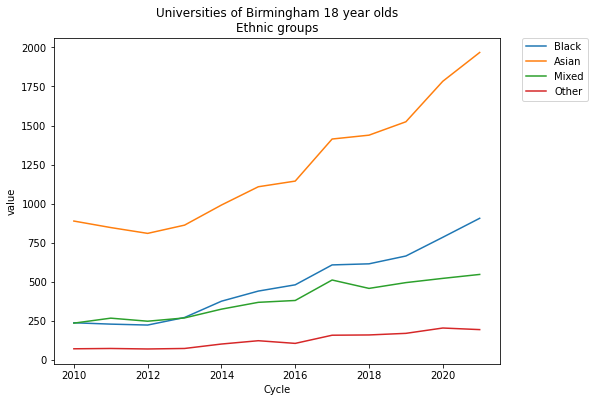

In [204]:
# This graph takes into account ONLY Universities of Birmingham and ONLY 18 year olds.
plt.figure(figsize=(8,6))
Black = df_UoB_Y13.query("equality_dimension == 'Black ethnic group'")
sns.lineplot(data=Black, x="Cycle", y="value", ci=None, label='Black')

Asian = df_UoB_Y13.query("equality_dimension == 'Asian ethnic group'")
sns.lineplot(data=Asian, x="Cycle", y="value", ci=None, label='Asian')

Mixed = df_UoB_Y13.query("equality_dimension == 'Mixed ethnic group'")
sns.lineplot(data=Mixed, x="Cycle", y="value", ci=None, label='Mixed')

Other = df_UoB_Y13.query("equality_dimension == 'Other ethnic group'")
sns.lineplot(data=Other, x="Cycle", y="value", ci=None, label='Other').set(title='Universities of Birmingham 18 year olds\n' + 'Ethnic groups')

# White = df_UoB_Y13.query("equality_dimension == 'White ethnic group'")
# sns.lineplot(data=White, x="Cycle", y="value", ci=None, label='White')

# Total = df_UoB_Y13.query("equality_dimension == 'Total'")
# sns.lineplot(data=Total, x="Cycle", y="value", ci=None, label='Total').set(title='Universities of Birmingham 18 year olds\n' + 'Ethnic groups')

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

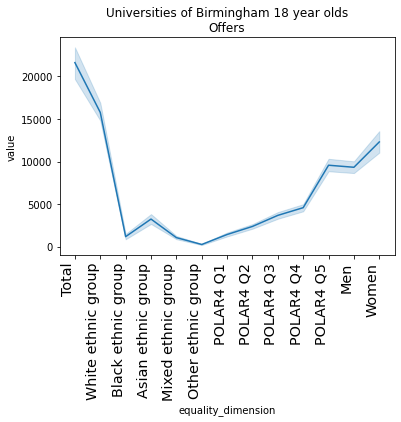

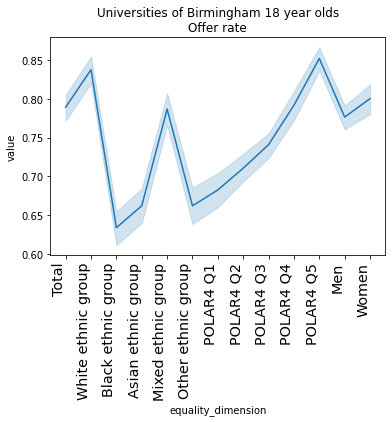

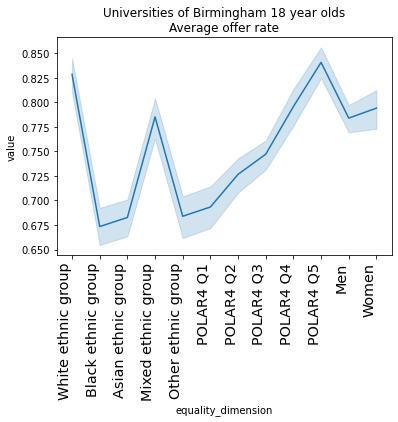

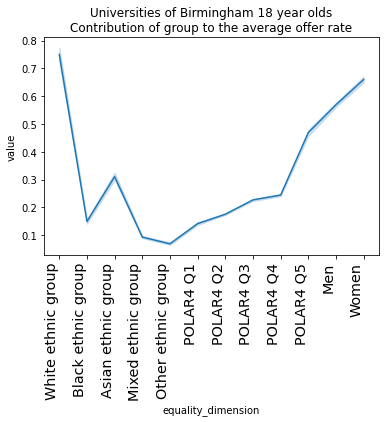

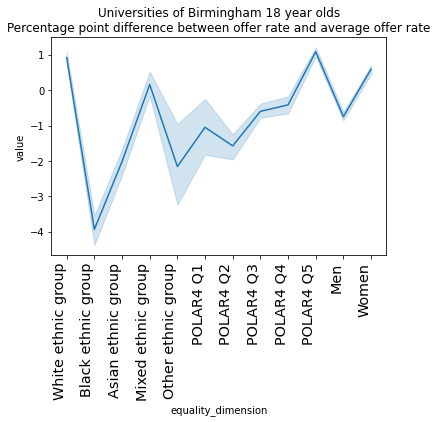

In [47]:
# This graph takes into account ONLY Universities of Birmingham and ONLY 18 year olds.
plt.figure(0)
Offers = df_UoB_Y13.query("statistic == 'Offers'")
chart = sns.lineplot(data=Offers, x="equality_dimension", y="value").set(title='Universities of Birmingham 18 year olds\n' + 'Offers')
plt.xticks(rotation=90, horizontalalignment='right', fontweight='light', fontsize='x-large')

plt.figure(1)
Offer_rate = df_UoB_Y13.query("statistic == 'Offer rate'")
chart = sns.lineplot(data=Offer_rate, x="equality_dimension", y="value").set(title='Universities of Birmingham 18 year olds\n' + 'Offer rate')
plt.xticks(rotation=90, horizontalalignment='right', fontweight='light', fontsize='x-large')

plt.figure(2)
Average_rate = df_UoB_Y13.query("statistic == 'Average offer rate'")
chart = sns.lineplot(data=Average_rate, x="equality_dimension", y="value").set(title='Universities of Birmingham 18 year olds\n' + 'Average offer rate')
plt.xticks(rotation=90, horizontalalignment='right', fontweight='light', fontsize='x-large')

plt.figure(3)
Average_Contribution = df_UoB_Y13.query("statistic == 'Contribution of group to the average offer rate'")
chart = sns.lineplot(data=Average_Contribution, x="equality_dimension", y="value").set(title='Universities of Birmingham 18 year olds\n' + 'Contribution of group to the average offer rate')
plt.xticks(rotation=90, horizontalalignment='right', fontweight='light', fontsize='x-large')

plt.figure(4)
Percentage_rate_average = df_UoB_Y13.query("statistic == 'Percentage point difference between offer rate and average offer rate'")
chart = sns.lineplot(data=Percentage_rate_average, x="equality_dimension", y="value").set(title='Universities of Birmingham 18 year olds\n' + 'Percentage point difference between offer rate and average offer rate')
plt.xticks(rotation=90, horizontalalignment='right', fontweight='light', fontsize='x-large')

plt.show()

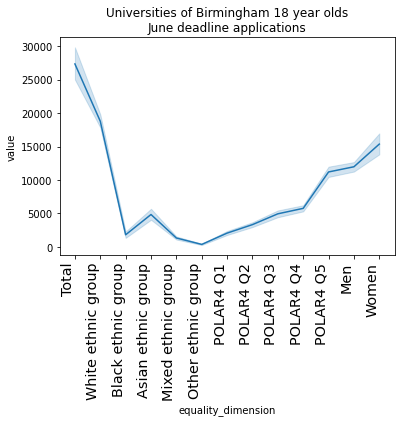

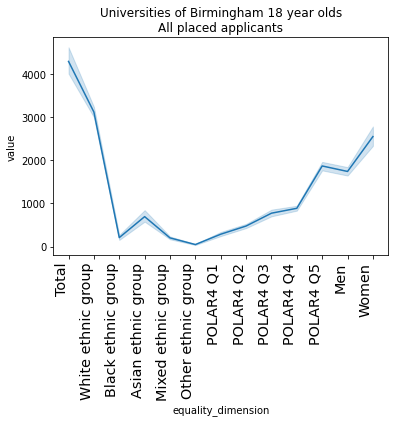

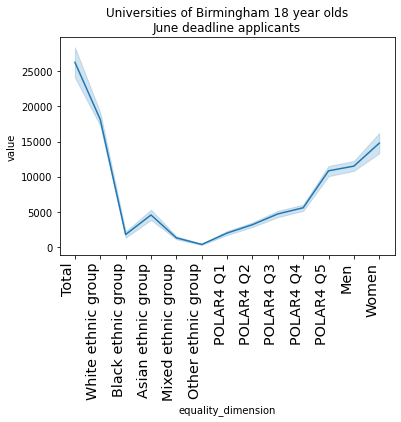

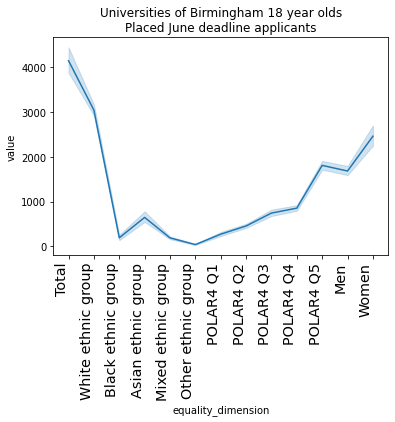

In [48]:
# This graph takes into account ONLY Universities of Birmingham and ONLY 18 year olds.
plt.figure(0)
applications = df_UoB_Y13.query("statistic == 'June deadline applications'")
chart = sns.lineplot(data=applications, x="equality_dimension", y="value").set(title='Universities of Birmingham 18 year olds\n' + 'June deadline applications')
plt.xticks(rotation=90, horizontalalignment='right', fontweight='light', fontsize='x-large')

plt.figure(1)
All_applicants = df_UoB_Y13.query("statistic == 'All placed applicants'")
chart = sns.lineplot(data=All_applicants, x="equality_dimension", y="value").set(title='Universities of Birmingham 18 year olds\n' + 'All placed applicants')
plt.xticks(rotation=90, horizontalalignment='right', fontweight='light', fontsize='x-large')

plt.figure(2)
June_applicants = df_UoB_Y13.query("statistic == 'June deadline applicants'")
chart = sns.lineplot(data=June_applicants, x="equality_dimension", y="value").set(title='Universities of Birmingham 18 year olds\n' + 'June deadline applicants')
plt.xticks(rotation=90, horizontalalignment='right', fontweight='light', fontsize='x-large')

plt.figure(3)
June_Placed = df_UoB_Y13.query("statistic == 'Placed June deadline applicants'")
chart = sns.lineplot(data=June_Placed, x="equality_dimension", y="value").set(title='Universities of Birmingham 18 year olds\n' + 'Placed June deadline applicants')
plt.xticks(rotation=90, horizontalalignment='right', fontweight='light', fontsize='x-large')

plt.show()

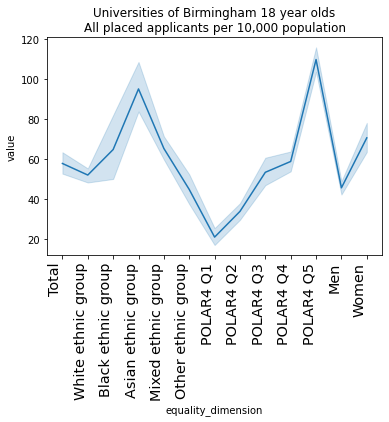

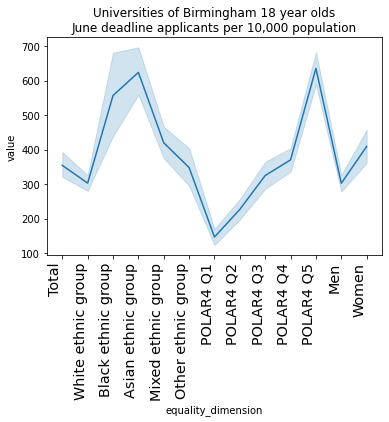

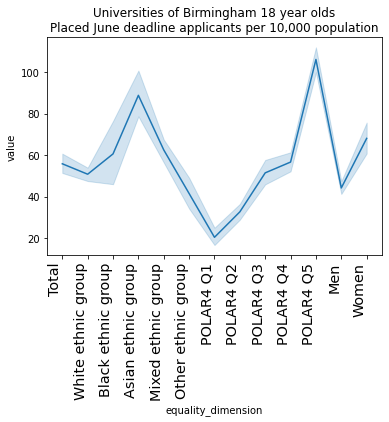

In [49]:
# This graph takes into account ONLY Universities of Birmingham and ONLY 18 year olds.
plt.figure(0)
All_placed10K = df_UoB_Y13.query("statistic == 'All placed applicants per 10,000 population'")
chart = sns.lineplot(data=All_placed10K, x="equality_dimension", y="value").set(title='Universities of Birmingham 18 year olds\n' + 'All placed applicants per 10,000 population')
plt.xticks(rotation=90, horizontalalignment='right', fontweight='light', fontsize='x-large')

plt.figure(1)
June_deadline10K = df_UoB_Y13.query("statistic == 'June deadline applicants per 10,000 population'")
chart = sns.lineplot(data=June_deadline10K, x="equality_dimension", y="value").set(title='Universities of Birmingham 18 year olds\n' + 'June deadline applicants per 10,000 population')
plt.xticks(rotation=90, horizontalalignment='right', fontweight='light', fontsize='x-large')

plt.figure(2)
Placed_June10K = df_UoB_Y13.query("statistic == 'Placed June deadline applicants per 10,000 population'")
chart = sns.lineplot(data=Placed_June10K, x="equality_dimension", y="value").set(title='Universities of Birmingham 18 year olds\n' + 'Placed June deadline applicants per 10,000 population')
plt.xticks(rotation=90, horizontalalignment='right', fontweight='light', fontsize='x-large')

plt.show()

In [50]:
# This graph takes into account ONLY Universities of Birmingham and ONLY 18 year olds.

import plotly.express as px

# All_placed10K = df_UoB_Y13.query("statistic == 'All placed applicants per 10,000 population'")
# chart = sns.lineplot(data=All_placed10K, x="equality_dimension", y="value").set(title='Universities of Birmingham 18 year olds\n' + 'All placed applicants per 10,000 population')
# plt.xticks(rotation=90, horizontalalignment='right', fontweight='light', fontsize='x-large')

fig = px.bar(df_UoB_Y13, x='equality_dimension', y='value', color='statistic')

fig.update_traces(textposition='inside')
fig.update_layout(uniformtext_minsize=22, uniformtext_mode='hide', title_text='Universities of Birmingham 18 year olds\n' + 'Statistic', title_x=0.45)

fig.show()

In [80]:
# This graph takes into account ALL universities and ALL ages (not only 18).

import plotly.express as px
#df_UoB_Y13 = df_UoB.loc[(df_UoB.agegroup == '18 year olds')]
data = df.loc[df.statistic == 'Percentage point difference between offer rate and average offer rate']
#data = df.query("statistic == 'Percentage point difference between offer rate and average offer rate'")

fig = px.bar(data, x='equality_dimension', y=data.value, color='statistic', base = 'statistic')
#barmode = 'overlay'

fig.update_traces(textposition='inside')
fig.update_layout(uniformtext_minsize=22, uniformtext_mode='hide', title_text='UK\n' + 'Statistic', title_x=0.45)

fig.show()

In [119]:
## ATTENTION! Let's use plotly because the graph made with sns looks suspicious (adding the values ut doesen't match).
## PROBLE! Plotly has both positive and negative values in the bar chart.

# Percentage_difference = df.query("statistic == 'Percentage point difference between offer rate and average offer rate'")

# chart = sns.barplot(data=Percentage_difference, x="equality_dimension", y="value", ci = None).set(title='UK\n' + 'Percentage point difference between offer rate and average offer rate')
# plt.xticks(rotation=90, horizontalalignment='right', fontweight='light', fontsize='x-large')

data1 = df_UoB_Y13.loc[df.statistic == 'Percentage point difference between offer rate and average offer rate'].sort_values(by=['equality_dimension'], ascending=False)
data1

,inst_all,INSTITUTION_CODE,Cycle,statistic,equality_dimension,agegroup,value
23747,B32 University of Birmingham,B32,2021,Percentage point difference between offer rate...,Women,18 year olds,0.6
23617,B32 University of Birmingham,B32,2011,Percentage point difference between offer rate...,Women,18 year olds,0.8
23630,B32 University of Birmingham,B32,2012,Percentage point difference between offer rate...,Women,18 year olds,0.7
23695,B32 University of Birmingham,B32,2017,Percentage point difference between offer rate...,Women,18 year olds,0.3
23669,B32 University of Birmingham,B32,2015,Percentage point difference between offer rate...,Women,18 year olds,0.5
...,...,...,...,...,...,...,...
23595,B32 University of Birmingham,B32,2010,Percentage point difference between offer rate...,Asian ethnic group,18 year olds,-3.5
23712,B32 University of Birmingham,B32,2019,Percentage point difference between offer rate...,Asian ethnic group,18 year olds,-1.0
23621,B32 University of Birmingham,B32,2012,Percentage point difference between offer rate...,Asian ethnic group,18 year olds,-2.6
23634,B32 University of Birmingham,B32,2013,Percentage point difference between offer rate...,Asian ethnic group,18 year olds,-1.3


Text(0.5, 0.98, 'UK\nPercentage point difference between offer rate and average offer rate')

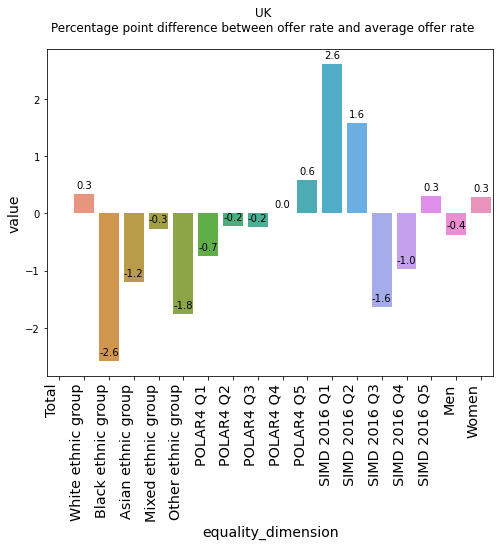

In [206]:
# This graph takes into account ALL universities and ALL ages (not only 18).

## ATTENTION! Let's use sns because plotly has BOTH positive and negative values in the graph.
Percentage_difference = df.query("statistic == 'Percentage point difference between offer rate and average offer rate'")

plt.figure(figsize=(8, 6))
splot=sns.barplot(x="equality_dimension",y="value",data=Percentage_difference, ci = None)
plt.xticks(rotation=90, horizontalalignment='right', fontweight='light', fontsize='x-large')

for p in splot.patches:
    splot.annotate(format(p.get_height(), '.1f'), 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   xytext = (0, 9), 
                   textcoords = 'offset points')
plt.xlabel("equality_dimension", size=14)
plt.ylabel("value", size=14)

splot.figure.suptitle('UK\n' + 'Percentage point difference between offer rate and average offer rate')

In [127]:
# This graph takes into account ONLY Universities of Birmingham and ONLY 18 year olds.

import plotly.express as px

# All_placed10K = df_UoB_Y13.query("statistic == 'All placed applicants per 10,000 population'")
# chart = sns.lineplot(data=All_placed10K, x="equality_dimension", y="value").set(title='Universities of Birmingham 18 year olds\n' + 'All placed applicants per 10,000 population')
# plt.xticks(rotation=90, horizontalalignment='right', fontweight='light', fontsize='x-large')

fig = px.line(df_UoB_Y13, x='Cycle', y='value', color='equality_dimension')

fig.update_layout(uniformtext_minsize=22, uniformtext_mode='hide', title_text='Universities of Birmingham 18 year olds\n' + 'Statistic', title_x=0.45)

fig.show()

Text(0.5, 0.98, 'UoB\nPercentage point difference between offer rate and average offer rate')

<Figure size 432x288 with 0 Axes>

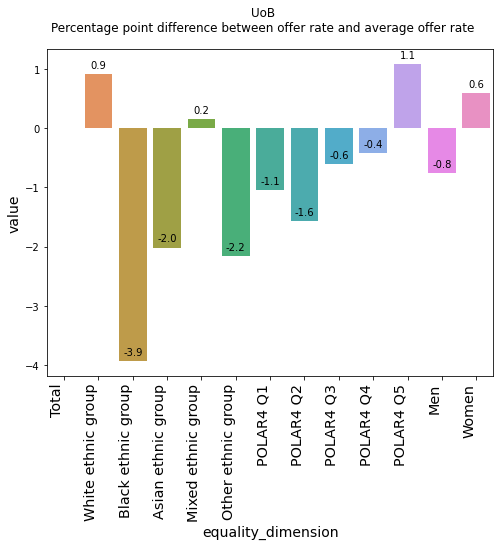

In [207]:
# This graph takes into account ONLY Universities of Birmingham and ONLY 18 year olds.
plt.figure(0)

Percentage_difference = df_UoB_Y13.query("statistic == 'Percentage point difference between offer rate and average offer rate'")

plt.figure(figsize=(8, 6))
splot=sns.barplot(x="equality_dimension",y="value",data=Percentage_difference, ci = None)
plt.xticks(rotation=90, horizontalalignment='right', fontweight='light', fontsize='x-large')

for p in splot.patches:
    splot.annotate(format(p.get_height(), '.1f'), 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   xytext = (0, 9), 
                   textcoords = 'offset points')
plt.xlabel("equality_dimension", size=14)
plt.ylabel("value", size=14)

splot.figure.suptitle('UoB\n' + 'Percentage point difference between offer rate and average offer rate')

In [52]:
## Using the pandas dataframe nunique() function with default parameters gives a count of all the distinct values in each column.
# This graph takes into account ALL universities and ALL ages (not only 18).
print(df.nunique())

inst_all                132
INSTITUTION_CODE        132
Cycle                    12
statistic                12
equality_dimension       18
agegroup                  2
value                 11306
dtype: int64


In [53]:
# This graph takes into account ALL universities and ALL ages (not only 18).
df_gb = df.groupby(['agegroup'])
df_agg = df_gb.agg({'agegroup': 'size'})
df_agg

,agegroup
agegroup,
18 year olds,257904
All ages,128952


In [54]:
# This graph takes into account ALL universities and ALL ages (not only 18).
df_gb = df.groupby(['equality_dimension'])
df_agg = df_gb.agg({'equality_dimension': 'size'})
df_agg

,equality_dimension
equality_dimension,
Asian ethnic group,28512
Black ethnic group,28512
Men,28512
Mixed ethnic group,28512
Other ethnic group,28512
POLAR4 Q1,28512
POLAR4 Q2,28512
POLAR4 Q3,28512
POLAR4 Q4,28512


In [55]:
# This graph takes into account ALL universities and ALL ages (not only 18).
df_gb = df.groupby(['statistic'])
df_agg = df_gb.agg({'statistic': 'size'})
df_agg

,statistic
statistic,
All placed applicants,42984
"All placed applicants per 10,000 population",21492
Average offer rate,21492
Contribution of group to the average offer rate,21492
June deadline applicants,42984
"June deadline applicants per 10,000 population",21492
June deadline applications,42984
Offer rate,42984
Offers,42984


In [56]:
# This graph takes into account ALL universities and ALL ages (not only 18).
df_gb = df.groupby(['Cycle'])
df_agg = df_gb.agg({'Cycle': 'size'})
df_agg

,Cycle
Cycle,
2010,32238
2011,32238
2012,32238
2013,32238
2014,32238
2015,32238
2016,32238
2017,32238
2018,32238


In [57]:
# This graph takes into account ALL universities and ALL ages (not only 18).
df_gb = df.groupby(['inst_all'])
df_agg = df_gb.agg({'inst_all': 'size'})
df_agg.head(15)

,inst_all
inst_all,
A20 University of Aberdeen,3888
A30 Abertay University,3888
A40 Aberystwyth University,2808
A60 Anglia Ruskin University,2808
A66 Arts University Bournemouth,2808
A80 Aston University Birmingham,2808
B06 Bangor University,2808
B16 University of Bath,2808
B20 Bath Spa University,2808
